<a href="https://colab.research.google.com/github/RahulV-24/Robust_Lane_Detection_Using_OpenCV/blob/main/Lane_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

ROBUST LANE DETECTION & TRACKING

Designed a robust lane detection system for real-time applications, integrating OpenCV for visual road detection on Raspberry Pi 3 integrated with Pi camera rev 1.3 .


# Image Processing

![Test Image](https://drive.google.com/uc?export=view&id=1pObOeubK7ax2xmPYWCxrLCaLa8Sf9Tqa)



---



---


![final image](https://drive.google.com/uc?export=view&id=1iVMhPyS1vEmkQEoxWiLK6PYESIT1sHU_)



Code for the above traansormation

In [7]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow #for image display
import matplotlib.pylab as plt
from skimage import io


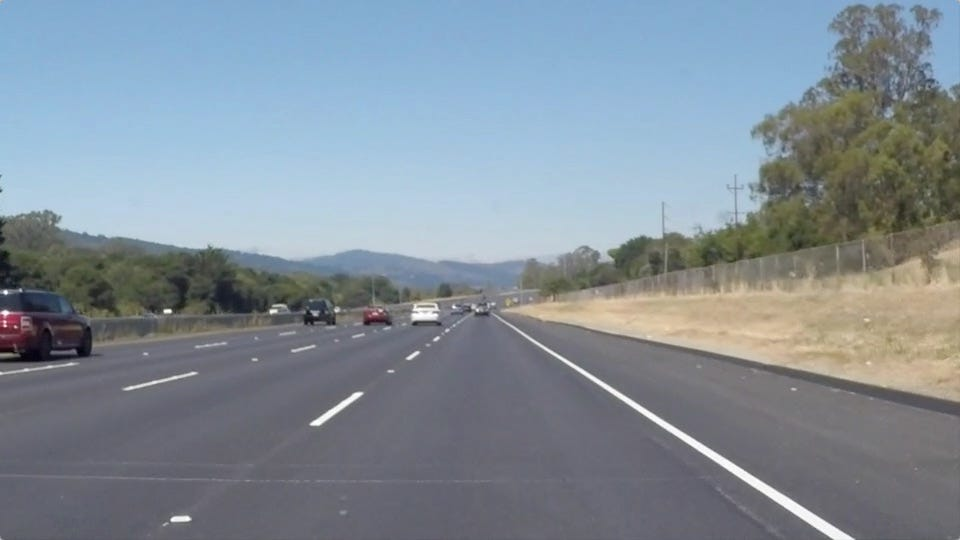

In [8]:
img = io.imread("https://drive.google.com/uc?export=view&id=1pObOeubK7ax2xmPYWCxrLCaLa8Sf9Tqa")
#cv2_imshow(img)
image = cv.cvtColor(img,cv.COLOR_BGR2RGB)
cv2_imshow(image)


**Normal Image to GrayScale Conversion**

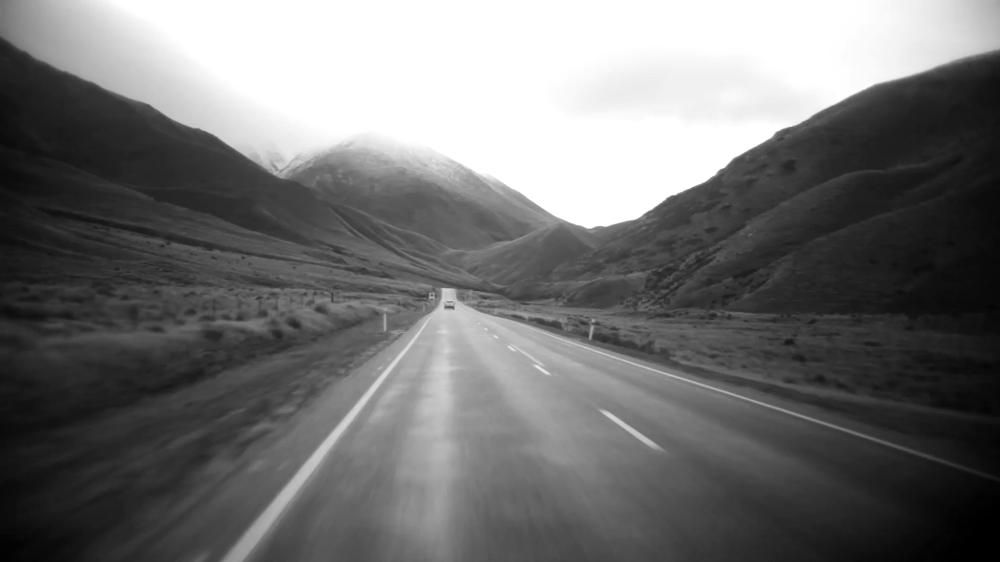

In [28]:
image = cv.cvtColor(frame,cv.COLOR_BGR2RGB)
def graycolor(image):
  #lane_image = np.copy(image)
  gray =  cv.cvtColor(image,cv.COLOR_RGB2GRAY)
  return gray
Gray = graycolor(image)
cv2_imshow(Gray)

**Gaussian Blur**

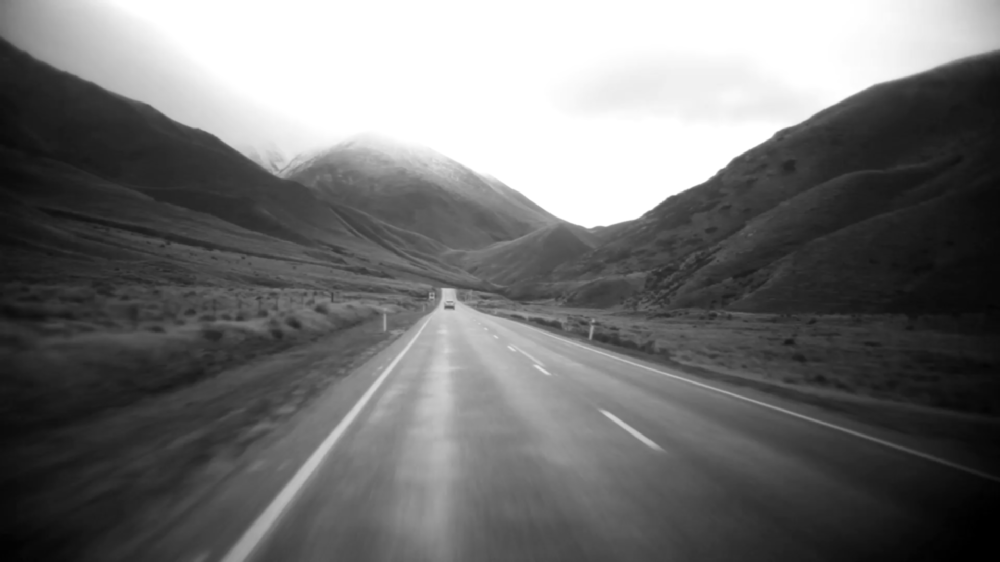

In [29]:
  def Blur(image):
   blur_image = cv.GaussianBlur(image,(5,5),0)
   return blur_image
  blur = Blur(Gray)
  cv2_imshow(blur)

**canny Edge Detection of Blurred Image**

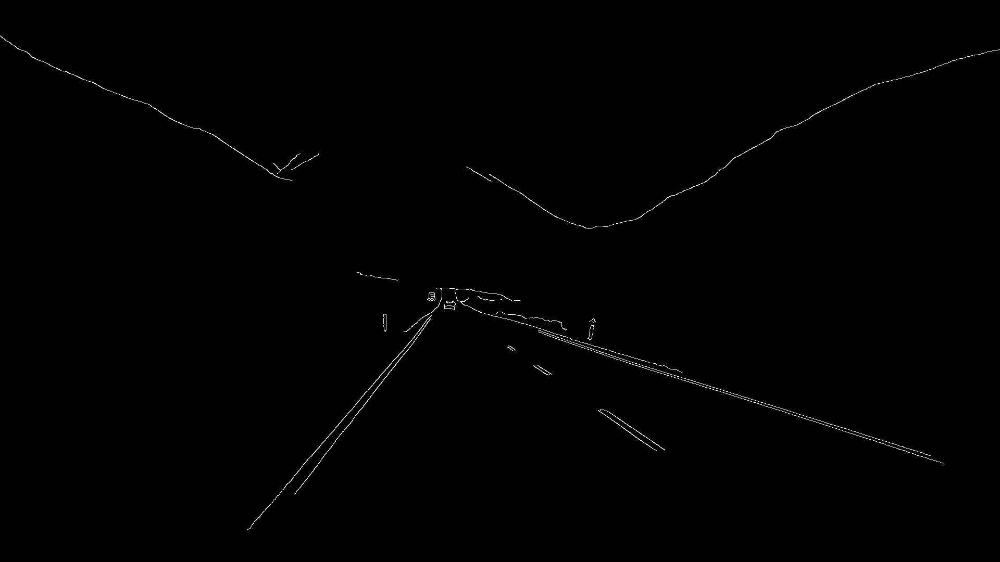

In [30]:
  def canny_edge(image):
    canny = cv.Canny(image,50,150)
    return canny
  canny = canny_edge(blur)
  cv2_imshow(canny)

**Finding Region of Interest**

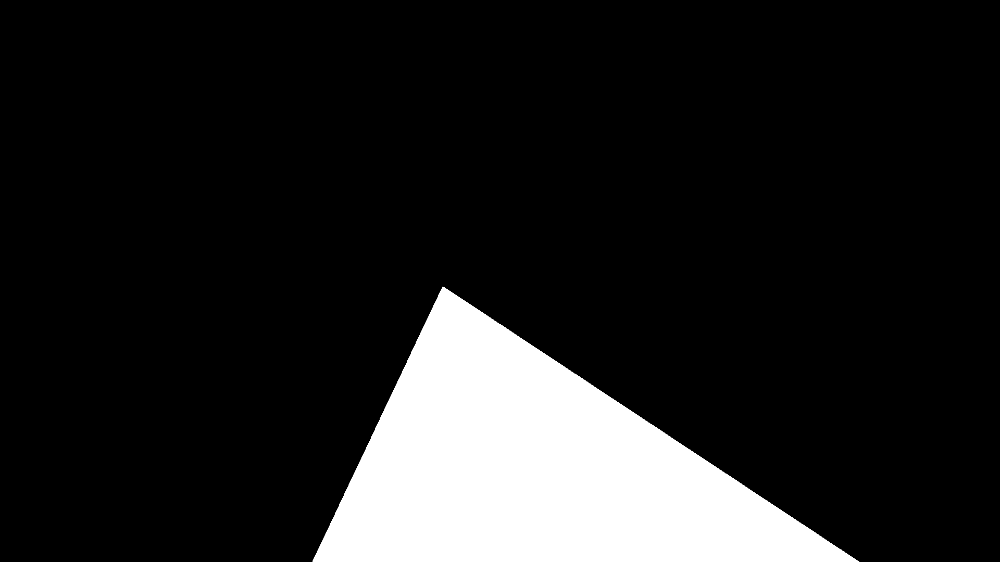

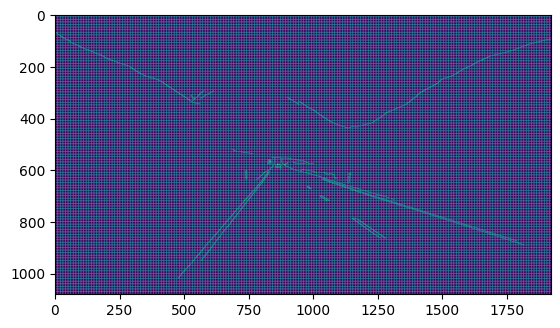

In [31]:
canny_cp = np.copy(canny)
grid_color = -1
dx, dy = 10,10
canny_cp[:,::dy] = grid_color
canny_cp[::dx,:] = grid_color

#plt.imshow(canny_cp,'gray',vmin=-1,vmax=1)
plt.imshow(canny_cp)
def ROI(image):
  height = image.shape[0]
  triangle  = np.array([(600,height),(1650,height),(850,550)], 'int32')
  mask = np.zeros_like(image)
  cv.fillPoly(mask ,np.int32([triangle]) , 255)
  return mask
mask = ROI(canny)
cv2_imshow(mask)

**Bitwise Region of interest and Canny image so that only that pixels are non zero.**

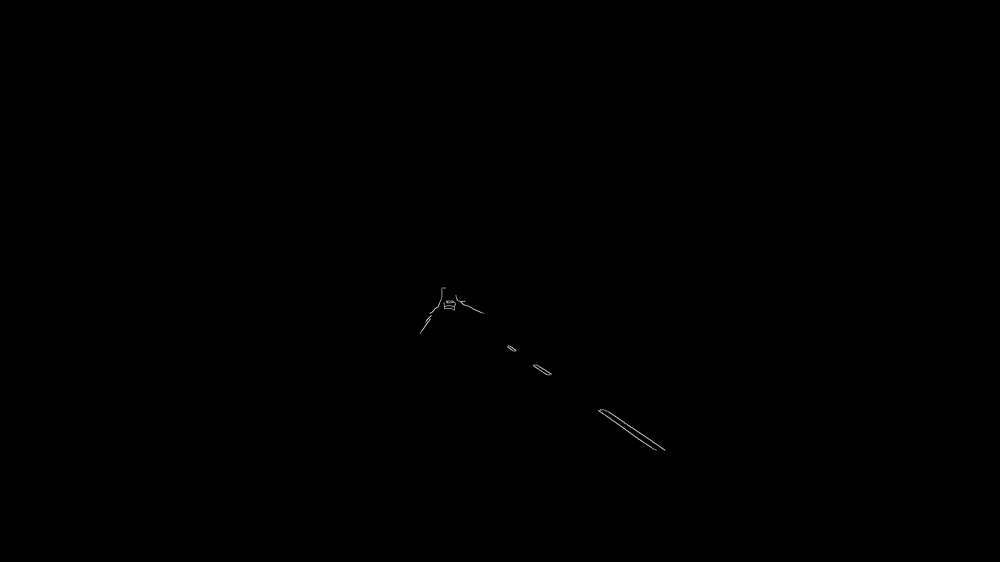

In [32]:
  def masked_img(image,mask):
    masked_image = cv.bitwise_and(image, mask)
    return masked_image

  masked_image = masked_img(canny,mask)
  cv2_imshow(masked_image)

**Drawing the edge lines**

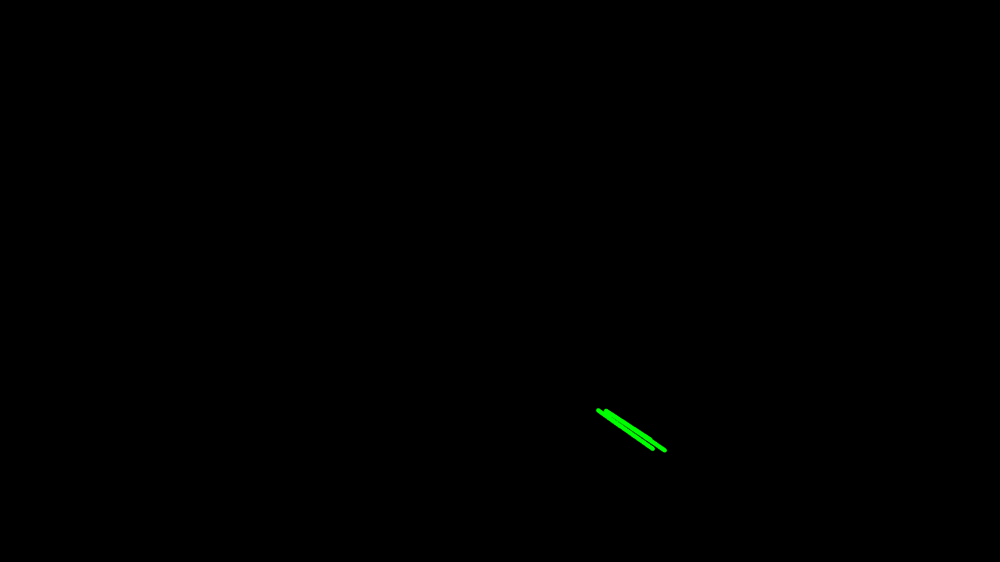

In [33]:
 # Standard Hough Line Transform
lines = cv.HoughLinesP(masked_image, 2, np.pi / 180, 100,np.array([]), minLineLength=40,maxLineGap=5)

  # Display Lines
def lines_display(image,lines):
  line_image = np.zeros_like(image)
  if lines is not None:
    for line in lines:
      x1,y1,x2,y2   = line.reshape(4)
      cv.line(line_image,(x1,y1),(x2,y2),(0,255,0),8)
  return line_image
line_image = lines_display(image,lines)
cv2_imshow(line_image)

Lines on Original Image

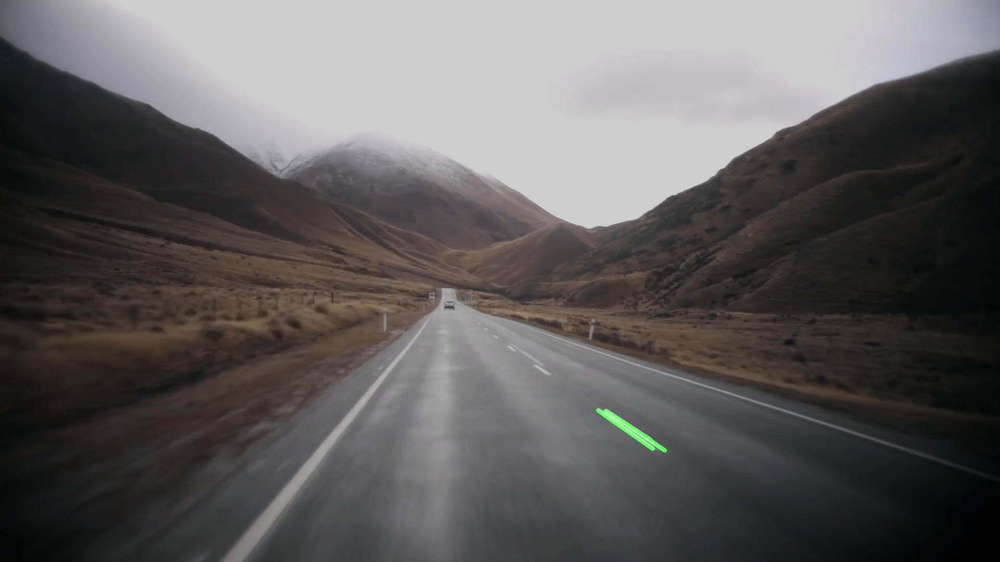

In [34]:
#combine Image
def Combine(image,line_image):
  combo_image = cv.addWeighted(image, 0.8,line_image,1,1)
  return combo_image
cv2_imshow(Combine(image,line_image))

**Averageing Lines**

  avg = a.mean(axis, **keepdims_kw)

  ret = ret.dtype.type(ret / rcount)



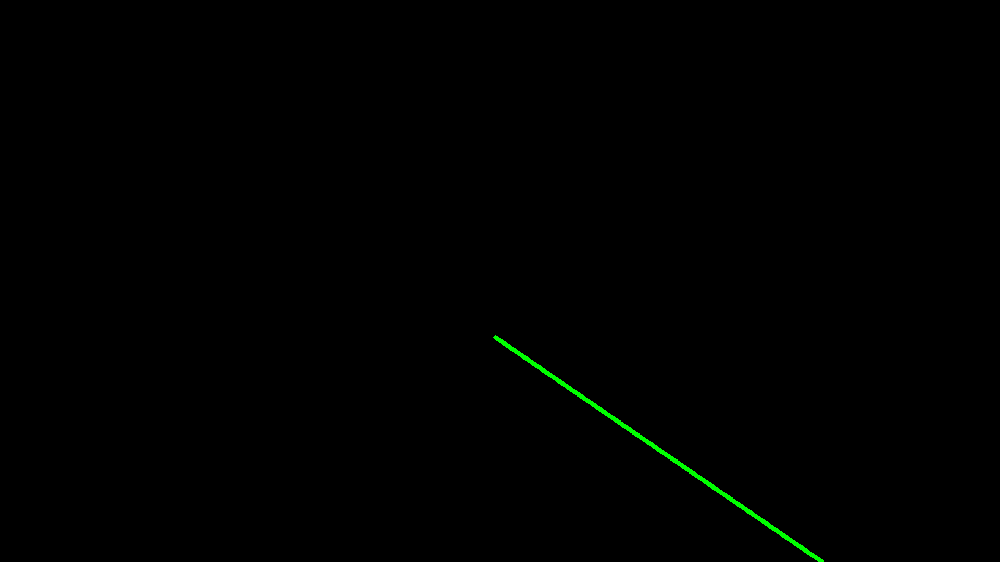

In [35]:
def coordinates(image, line_parameters):
  try:
    slope, intercept = line_parameters
  except TypeError:
    slope, intercept = 0.001, 0
  y1 = image.shape[0]
  y2 = int(y1*(3/5))
  x1 = int((y1-intercept)/slope)
  x2 = int((y2-intercept)/slope)
  return np.array([x1,y1,x2,y2])

def average(lines):
  left_lines = []
  right_lines = []
  if lines is not None:
    for line in lines:
      x1,y1,x2,y2 = line.reshape(4)
      fit = np.polyfit((x1, x2), (y1, y2), 1)
      slope = fit[0]
      intercept = fit[1]
      if slope < 0:
        left_lines.append((slope,intercept))
      else:
        right_lines.append((slope,intercept))
  left_lines_average = np.average(left_lines,axis = 0)
  right_lines_average = np.average(right_lines,axis = 0)
 # print(left_lines_average)
 # print(right_lines_average)
  left_line = coordinates(image, left_lines_average)
  right_line = coordinates(image, right_lines_average)
  averaged_lines = np.array([left_line,right_line])
  return averaged_lines
average_line_image = lines_display(image,average(lines))
cv2_imshow(average_line_image)

**Final Image**

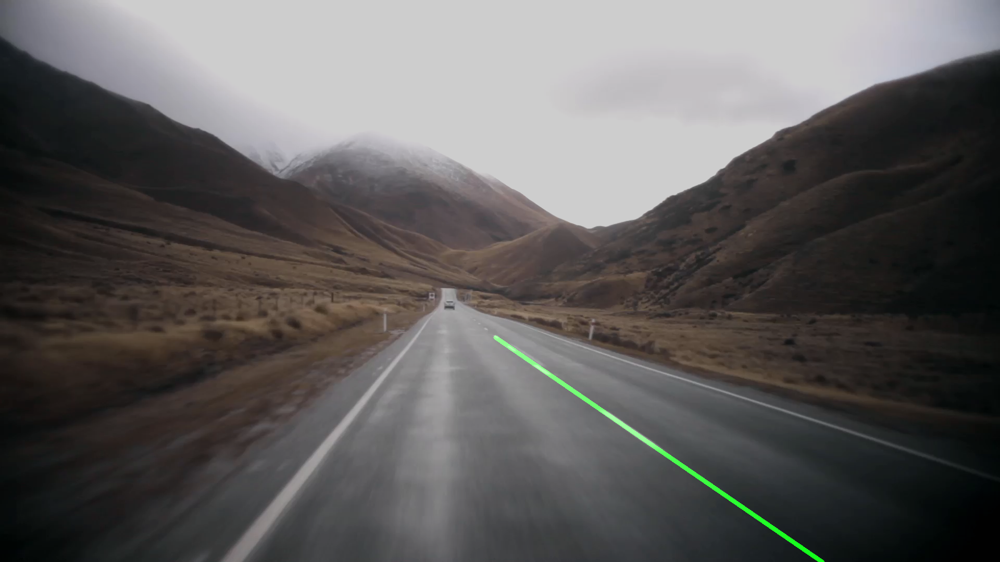

In [36]:
final_image = Combine(image,average_line_image)
cv2_imshow(final_image)

**Final Code**

  avg = a.mean(axis, **keepdims_kw)

  ret = ret.dtype.type(ret / rcount)



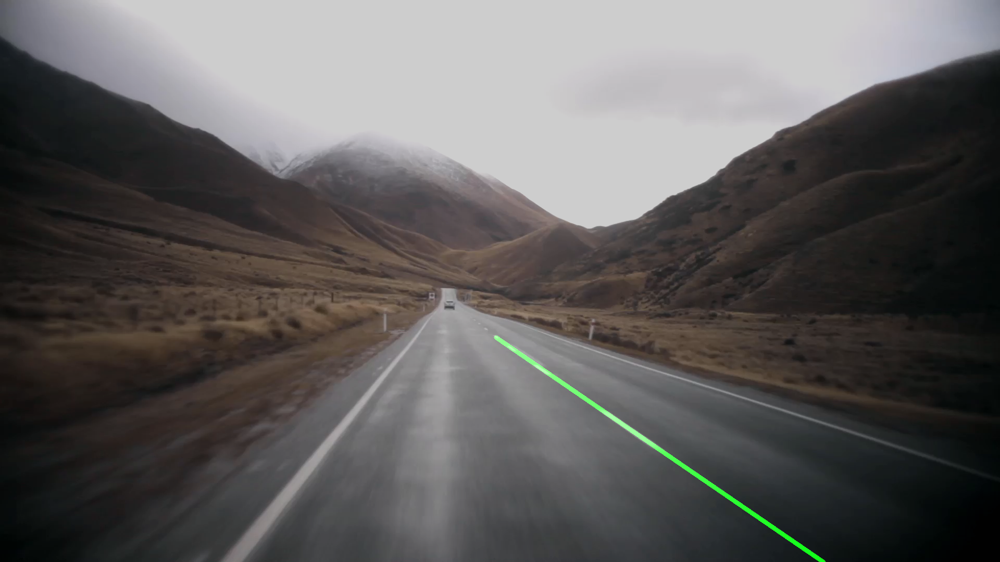

In [77]:
#img = io.imread("https://drive.google.com/uc?export=view&id=1pObOeubK7ax2xmPYWCxrLCaLa8Sf9Tqa")
#cv2_imshow(img)
#image = cv.cvtColor(img,cv.COLOR_BGR2RGB)
#image = frame
def process(image):
  Gray = graycolor(image)
  blur = Blur(Gray)
  canny = canny_edge(blur)
  mask = ROI(canny)
  masked_image = masked_img(canny,mask)
  lines = cv.HoughLinesP(masked_image, 2, np.pi / 180, 90,np.array([]), minLineLength=40,maxLineGap=5)
  #lines_display(image,lines)
  average_line_image = lines_display(image,average(lines))
  final_image = Combine(image,average_line_image)
  return final_image

cv2_imshow(process(image))

# Video Processing

Till now we have processed image for detecting lane. Now we would take video video input and process it.

In [133]:
from moviepy.editor import *
from IPython.display import HTML
from PIL import Image
import matplotlib.image as mpimg
from google.colab.patches import cv2_imshow

from google.colab import drive
drive.mount('/gdrive')



Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [117]:
clip1 = VideoFileClip('/gdrive/MyDrive/winterDay.mp4')
white_output = '/gdrive/MyDrive/result.mp4'

def vprocess(clip1):
  frame = clip1.get_frame(0)
  print(type(process))
  white_clip = clip1.fl_image(process)  #NOTE: this function expects color images!!
  white_clip.write_videofile(white_output, audio=False)

vprocess(clip1)

  avg = a.mean(axis, **keepdims_kw)

  ret = ret.dtype.type(ret / rcount)



<class 'function'>
Moviepy - Building video /gdrive/MyDrive/result.mp4.
Moviepy - Writing video /gdrive/MyDrive/result.mp4



Moviepy - Done !
Moviepy - video ready /gdrive/MyDrive/result.mp4


Processed Video

In [151]:
from IPython.display import HTML
from base64 import b64encode
video_path = '/gdrive/MyDrive/result.mp4'

mp4 = open(video_path,'rb').read()
decoded_vid = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f'<video width=560 controls><source src={decoded_vid} type="video/mp4"></video>')


# Parallel Processing

To increase speed of processing we will process pipeline parallely on all cores available.

***Please note that for small videos, the processing time may not differ significantly(around 30% reduction).**

**However, these optimizations can have a noticeable impact on processing times, especially when dealing with real-time or long videos**

In [97]:
import multiprocessing as mp
import concurrent.futures
import os

In [90]:
clip1 = VideoFileClip('/gdrive/MyDrive/winterDay.mp4')
white_output = '/gdrive/MyDrive/result.mp4'

n_cores = mp.cpu_count() # Count the number of cores
print(n_cores)



2


In [153]:
cap = cv.VideoCapture('/gdrive/MyDrive/winterDay.mp4')

FRAMES_AT_A_TIME = 16
pool_size = min(FRAMES_AT_A_TIME, os.cpu_count())
f = 1
clips = []
def save_video(frames):
    # Create a VideoFileClip from the frames
  video_clip = ImageSequenceClip(frames, fps=20)
  return video_clip

with concurrent.futures.ThreadPoolExecutor(max_workers=pool_size) as executor:
  more_frames = True

  while more_frames:
    frames = []
    for _ in range(FRAMES_AT_A_TIME):
      ret, fullimg = cap.read()
      if not ret:
        more_frames = False
        break
      frames.append(fullimg)

    if not frames:
      break # no frames

    results = executor.map(process, frames)
    processed = list(results)

    clips.append(save_video(processed))

    # Concatenate the processed video clips
  final_video = concatenate_videoclips(clips)
  final_video.write_videofile('/gdrive/MyDrive/result.mp4', codec='libx264', threads=4)
  cap.release()

Moviepy - Building video /gdrive/MyDrive/result.mp4.
Moviepy - Writing video /gdrive/MyDrive/result.mp4



Moviepy - Done !
Moviepy - video ready /gdrive/MyDrive/result.mp4
